- presentation mode

In [22]:
# get formating done automatically according to style `black`
%load_ext lab_black

In [1]:
urlpath = '/pool/data/ICDC/ocean/hadisst1/DATA/HadISST_sst.nc'

In [2]:
!ls -all --block-size='MB' /pool/data/ICDC/ocean/hadisst1/DATA/HadISST_sst.nc

-rw-rw-r-- 1 u220001 icdc 467MB Apr 17 10:08 /pool/data/ICDC/ocean/hadisst1/DATA/HadISST_sst.nc


# read netcdf
the old netcdf way 🙄 

In [3]:
from netCDF4 import Dataset
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

In [4]:
ds = Dataset(urlpath) 

[netcdf](https://www.unidata.ucar.edu/software/netcdf/) is a self-describing data format.

In [5]:
ds

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_CLASSIC data model, file format NETCDF3):
    Title: Monthly version of HadISST sea surface temperature component
    description: HadISST 1.1 monthly average sea surface temperature
    institution: Met Office Hadley Centre
    source: HadISST
    reference: Rayner, N. A., Parker, D. E., Horton, E. B., Folland, C. K., Alexander, L. V., Rowell, D. P., Kent, E. C., Kaplan, A.  Global analyses of sea surface temperature, sea ice, and night marine air temperature since the late nineteenth century J. Geophys. Res.Vol. 108, No. D14, 4407 10.1029/2002JD002670
    Conventions: CF-1.0
    history: Fri Apr 17 10:07:57 2020: ncatted -a _FillValue,sst,m,f,-1000 HadISST_sst_original.nc HadISST_sst.nc
11/3/2020 converted to netcdf from pp format
    supplementary_information: Updates and supplementary information will be available from http://www.metoffice.gov.uk/hadobs/hadisst
    comment: Data restrictions: for academic research use only. Dat

In [6]:
ds.variables.keys()

odict_keys(['time', 'time_bnds', 'latitude', 'longitude', 'sst'])

In [7]:
sst = ds.variables['sst']
sst

<class 'netCDF4._netCDF4.Variable'>
float32 sst(time, latitude, longitude)
    _FillValue: -1000.0
    standard_name: sea_surface_temperature
    long_name: sst
    units: C
    cell_methods: time: lat: lon: mean
    missing_value: -1e+30
unlimited dimensions: time
current shape = (1801, 180, 360)
filling on

In [8]:
sst.size/1e6

116.7048

In [9]:
sst.shape

(1801, 180, 360)

In [10]:
time = ds.variables['time']
time

<class 'netCDF4._netCDF4.Variable'>
float32 time(time)
    units: days since 1870-1-1 0:0:0
    calendar: gregorian
    long_name: Time
    standard_name: time
unlimited dimensions: time
current shape = (1789,)
filling on, default _FillValue of 9.969209968386869e+36 used

In [11]:
last_timestep = sst[-1,:,:]
last_timestep

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., -1.7999999523162842, -1.7999999523162842, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ..., False, False,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=-1000.0,
  dtype=float32)

In [12]:
type(last_timestep)

numpy.ma.core.MaskedArray

In [13]:
last_timestep.shape

(180, 360)

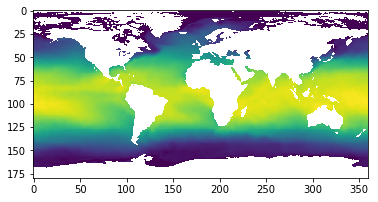

In [14]:
plt.imshow(last_timestep)

- only values shown
- no reference about
    - variable name
    - scale
    - time
    - unit
- How to plot April 2014? 🤔

# xarray

In [11]:
import xarray as xr

In [16]:
ds = xr.open_dataset(urlpath)

/work/mh0727/m300524/anaconda3/envs/xr/lib/python3.7/site-packages/xarray/conventions.py:401: SerializationWarning: variable 'sst' has multiple fill values {-1e+30, -1000.0}, decoding all values to NaN.
  stack_char_dim=stack_char_dim, use_cftime=use_cftime)


In [17]:
ds

<xarray.Dataset>
Dimensions:    (latitude: 180, longitude: 360, nv: 2, time: 1789)
Coordinates:
  * time       (time) datetime64[ns] 1870-01-16T11:59:59.505615234 ... 2019-01-16T12:00:00
  * latitude   (latitude) float32 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * longitude  (longitude) float32 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Dimensions without coordinates: nv
Data variables:
    time_bnds  (time, nv) float32 ...
    sst        (time, latitude, longitude) float32 ...
Attributes:
    Title:                      Monthly version of HadISST sea surface temper...
    description:                HadISST 1.1 monthly average sea surface tempe...
    institution:                Met Office Hadley Centre
    source:                     HadISST
    reference:                  Rayner, N. A., Parker, D. E., Horton, E. B., ...
    Conventions:                CF-1.0
    history:                    Mon Apr 29 12:23:08 2019: ncatted -a _FillVal...
    supplementary_information:  Updates and

In [18]:
ds['sst']

<xarray.DataArray 'sst' (time: 1789, latitude: 180, longitude: 360)>
[115927200 values with dtype=float32]
Coordinates:
  * time       (time) datetime64[ns] 1870-01-16T11:59:59.505615234 ... 2019-01-16T12:00:00
  * latitude   (latitude) float32 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * longitude  (longitude) float32 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      sst
    units:          C
    cell_methods:   time: lat: lon: mean

In [19]:
# underlying numpy.ndarray
type(ds['sst'].values)

numpy.ndarray

In [20]:
# dimensions gives axes names
ds['sst'].dims

('time', 'latitude', 'longitude')

In [21]:
# coordinates describe dimensions
ds['sst'].coords

Coordinates:
  * time       (time) datetime64[ns] 1870-01-16T11:59:59.505615234 ... 2019-01-16T12:00:00
  * latitude   (latitude) float32 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * longitude  (longitude) float32 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5

In [22]:
# remaining metadata in attrs
ds['sst'].attrs

OrderedDict([('standard_name', 'sea_surface_temperature'),
             ('long_name', 'sst'),
             ('units', 'C'),
             ('cell_methods', 'time: lat: lon: mean')])

In [23]:
ds['sst'].attrs['units']

'C'

## Intuitive API
when familiar with `pandas`

In [24]:
%%html
<iframe src="http://xarray.pydata.org/en/stable/api.html#indexing" width="1200" height="400"></iframe>

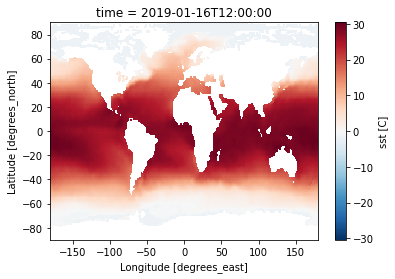

In [25]:
# only xr.dataArray can be plotted
ds.isel(time=-1)['sst'].plot()

## `xarray.plot()` understands `matplotlib` API

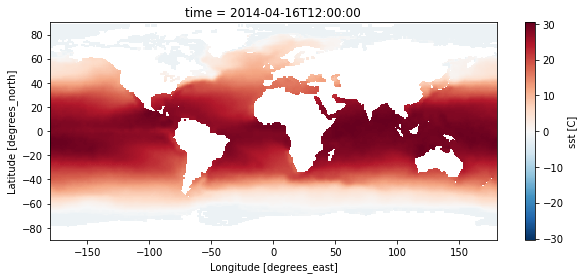

In [26]:
ds.sel(time='2014-04')['sst'].plot(figsize=(10,4))

## `xarray` plots map projections with `cartopy`

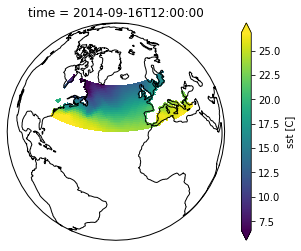

In [27]:
import cartopy.crs as ccrs
ax = plt.axes(projection=ccrs.Orthographic(-30, 35))
# slicing spatial dimensions
ds.sel(time='2014-09',longitude=slice(-80,30),latitude=slice(60,35))['sst'].plot(ax=ax,
                                                                                 transform=ccrs.PlateCarree(),
                                                                                 robust=True)
ax.set_global()
ax.coastlines()

## example: Warming of the oceans per latitude over time

Quick example how to prototype a scientific figure.

Scientific question: Do the oceans warm over time? Where is the strongest warming?

/work/mh0727/m300524/anaconda3/envs/xr/lib/python3.7/site-packages/xarray/core/nanops.py:159: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


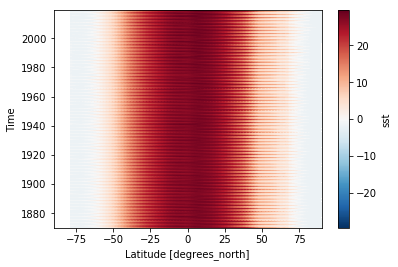

In [28]:
# naive first plot
ds['sst'].mean('longitude').plot()

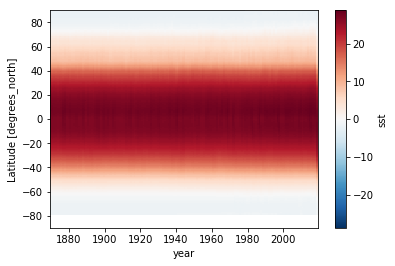

In [29]:
# seasonal cycle and latitudinal gradient dominates: polar oceans are cooler than the tropics
ds['sst'].groupby('time.year').mean('time').mean('longitude').T.plot()

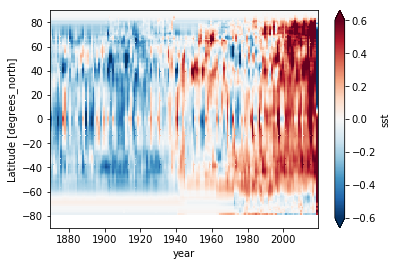

In [30]:
# anomaly plot shows relative warming over time
(ds['sst']-ds['sst'].mean('time')).groupby('time.year').mean('time').mean('longitude').T.plot(robust=True)

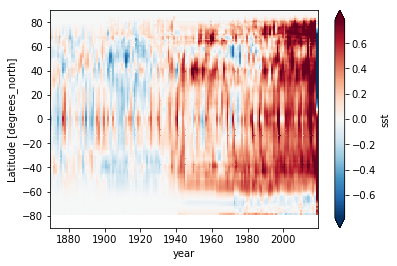

In [31]:
# set a reference time for anomaly calculation
(ds['sst']-ds['sst'].sel(time=slice('1850','1900')).mean('time')).groupby('time.year').mean('time').mean('longitude').T.plot(robust=True)

# assessing CMIP6 data with `intake` with `dask`

The objective of the Coupled Model Intercomparison Project (`CMIP`) is to better understand past, present and future climate changes arising from natural, unforced variability or in response to changes in radiative forcing in a multi-model context.
https://www.wcrp-climate.org/wgcm-cmip

In [78]:
# x of ~30 PB output downloaded to supercomputer organized in a folder structure formatted to common requirements
#                             ... /activity_id/institution_id/source_id/experiment_id/member_id/table_id/variable_id/grid_label/version/file
!ls /work/ik1017/CMIP6/data/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/historical/r1i1p1f1/Omon/tos/gn/v20190710

tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_185001-186912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_187001-188912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_189001-190912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_191001-192912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_193001-194912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_195001-196912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_197001-198912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_199001-200912.nc
tos_Omon_MPI-ESM1-2-LR_historical_r1i1p1f1_gn_201001-201412.nc


In [12]:
from dask.distributed import Client
import multiprocessing

ncpu = multiprocessing.cpu_count()
threads = 6
nworker = ncpu // threads
print(
    f"Number of CPUs: {ncpu}, number of threads: {threads}, number of workers: {nworker}"
)

# client also starts dask dashboard
client = Client(
    processes=False, threads_per_worker=threads, n_workers=nworker, memory_limit="64GB"
)
client

Number of CPUs: 48, number of threads: 6, number of workers: 8


Client Scheduler: inproc://10.50.37.158/29952/1 Dashboard: http://localhost:8888/proxy/8787/status,Cluster Workers: 8 Cores: 48 Memory: 512.00 GB


In [13]:
# intake facilitates file browsing and access, checkout intake for reading in .csv files and plugins for S3, SQL, etc ... https://intake.readthedocs.io/en/latest/plugin-directory.html
import intake

In [14]:
# json file contains the rules for concat and merge as well as the location for the catalog .csv file
col_url = "/work/ik1017/Catalogs/mistral-cmip6.json"

In [15]:
#!cat /work/ik1017/Catalogs/mistral-cmip6.json

In [16]:
col = intake.open_esm_datastore(col_url)
col

,unique
activity_id,19
institution_id,38
source_id,89
experiment_id,206
member_id,399
table_id,38
variable_id,1158
grid_label,12
dcpp_init_year,60
version,476


In [17]:
# col.df is a pandas.DataFrame
col.df.head()

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,dcpp_init_year,version,time_range,path
0,AerChemMIP,HAMMOZ-Consortium,MPI-ESM-1-2-HAM,ssp370-lowNTCF,r1i1p1f1,Lmon,npp,gn,NaN,v20190627,203501-205412,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/Aer...
1,AerChemMIP,HAMMOZ-Consortium,MPI-ESM-1-2-HAM,ssp370-lowNTCF,r1i1p1f1,Lmon,npp,gn,NaN,v20190627,201501-203412,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/Aer...
2,AerChemMIP,HAMMOZ-Consortium,MPI-ESM-1-2-HAM,ssp370-lowNTCF,r1i1p1f1,Lmon,npp,gn,NaN,v20190627,205501-205512,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/Aer...
3,AerChemMIP,HAMMOZ-Consortium,MPI-ESM-1-2-HAM,ssp370-lowNTCF,r1i1p1f1,Lmon,tsl,gn,NaN,v20190627,205501-205512,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/Aer...
4,AerChemMIP,HAMMOZ-Consortium,MPI-ESM-1-2-HAM,ssp370-lowNTCF,r1i1p1f1,Lmon,tsl,gn,NaN,v20190627,201501-203412,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/Aer...


In [18]:
# overview of available keys and accepted values
uni_dict = col.unique(["source_id", "institution_id", "table_id", "experiment_id"])
import pprint
#pprint.pprint(uni_dict, compact=True)

In [19]:
# quick check by hand
# col.df.source_id.unique()

## Global mean surface temperature `GMST` MPI-ESM-LR

In [42]:
# col.search selects the experiments you specify in `query`
variable = "tas"
query = dict(
    experiment_id="historical",
    table_id="Amon",
    member_id="r1i1p1f1",
    variable_id=variable,
    source_id="MPI-ESM1-2-LR",
)
cat = col.search(**query)
cat.df.head()

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,dcpp_init_year,version,time_range,path
0,CMIP,MPI-M,MPI-ESM1-2-LR,historical,r1i1p1f1,Amon,tas,gn,NaN,v20190710,189001-190912,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/CMI...
1,CMIP,MPI-M,MPI-ESM1-2-LR,historical,r1i1p1f1,Amon,tas,gn,NaN,v20190710,201001-201412,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/CMI...
2,CMIP,MPI-M,MPI-ESM1-2-LR,historical,r1i1p1f1,Amon,tas,gn,NaN,v20190710,195001-196912,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/CMI...
3,CMIP,MPI-M,MPI-ESM1-2-LR,historical,r1i1p1f1,Amon,tas,gn,NaN,v20190710,197001-198912,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/CMI...
4,CMIP,MPI-M,MPI-ESM1-2-LR,historical,r1i1p1f1,Amon,tas,gn,NaN,v20190710,187001-188912,/mnt/lustre02/work/ik1017/CMIP6/data/CMIP6/CMI...


In [75]:
# this gets xr.Datasets from netcdf files with `dask`
dset_dict = cat.to_dataset_dict(cdf_kwargs={"chunks": {"time": -1}})
# show the dict of available xr.Datasets: returned as dict because different models have different coordinates
list(dset_dict)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


['CMIP.MPI-M.MPI-ESM1-2-LR.historical.Amon.gn']

In [76]:
# get first item
_, ds = dset_dict.popitem()
# extract xr.dataArray
da = ds[variable].squeeze()

# lazy data
print(type(da.data))
da.data

<class 'dask.array.core.Array'>


dask.array<getitem, shape=(1980, 96, 192), dtype=float32, chunksize=(240, 96, 192), chunktype=numpy.ndarray>

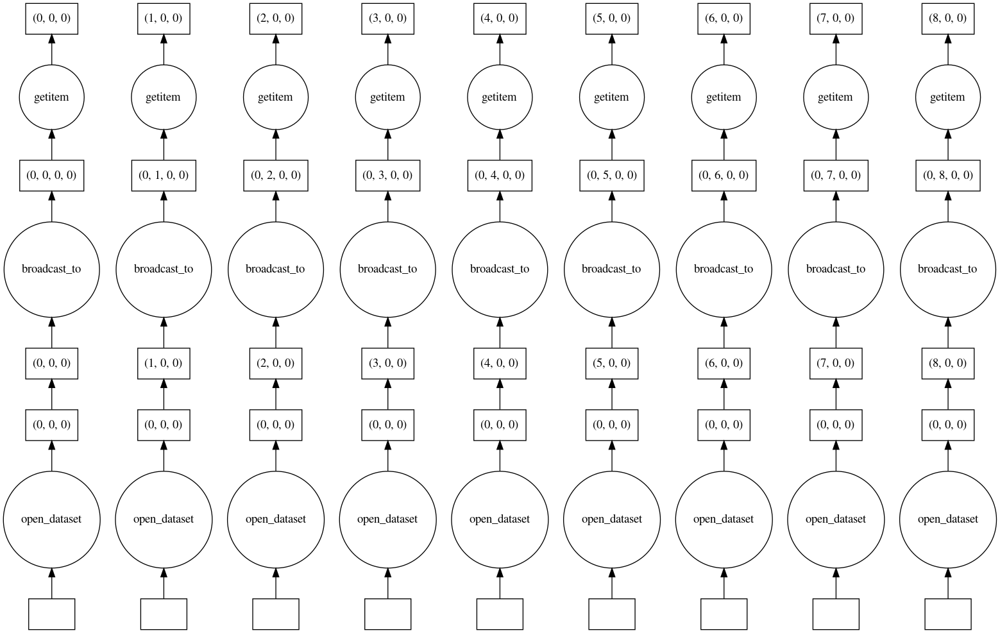

In [81]:
# embarrasingly parallel workflow
da.data.visualize()

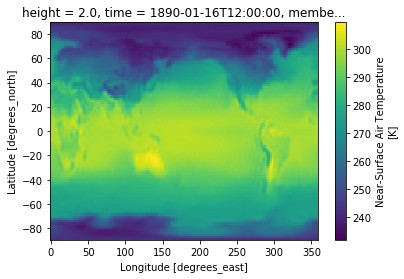

In [64]:
# weird is that .isel(time=0) is not 1850
da.isel(time=0).plot()

In [81]:
def yearmean(ds, dim="time"):
    return ds.groupby(f"{dim}.year").mean().rename({"year": dim})

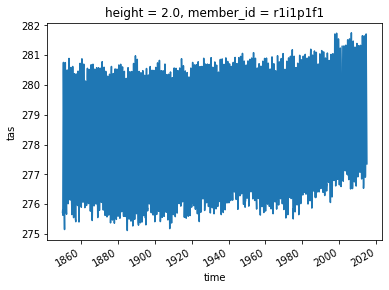

In [66]:
# persist to keep gmst in dask memory
gmst = da.mean(["lon", "lat"]).sortby('time')#.persist()
gmst.plot()

CPU times: user 2.53 s, sys: 608 ms, total: 3.13 s
Wall time: 1.55 s


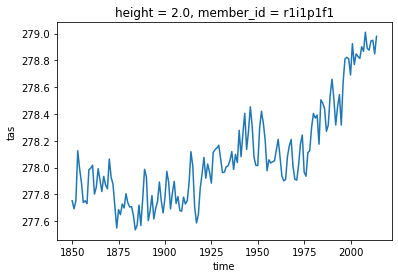

In [67]:
# remove seasonal cycle by yearmean for annual averages
gmst_ym = yearmean(da).mean(["lon", "lat"])
%time gmst_ym.plot()

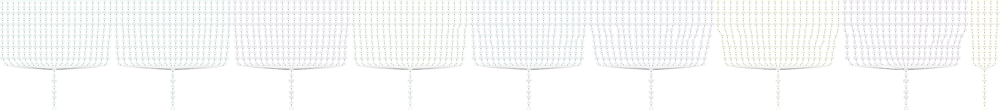

In [70]:
gmst_ym.data.visualize(color='order',cmap='viridis',optimize_graph=False)

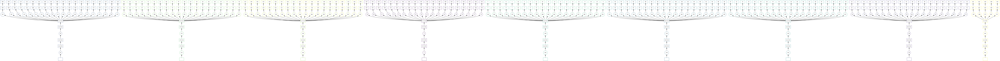

In [112]:
gmst_ym.data.visualize(color='order',cmap='viridis',optimize_graph=True)

### xr.map_blocks

In [106]:
# template sometimes needed when xr.map_blocks cannot guess the shape of the result in custom functions
template = gmst.sel(time=gmst.time.dt.month==1).assign_coords(time=a.sel(time=a.time.dt.month==1).time.dt.year)
gmst_ym_map_blocks = xr.map_blocks(yearmean, gmst, template=template)

gmst_ym_map_blocks.data

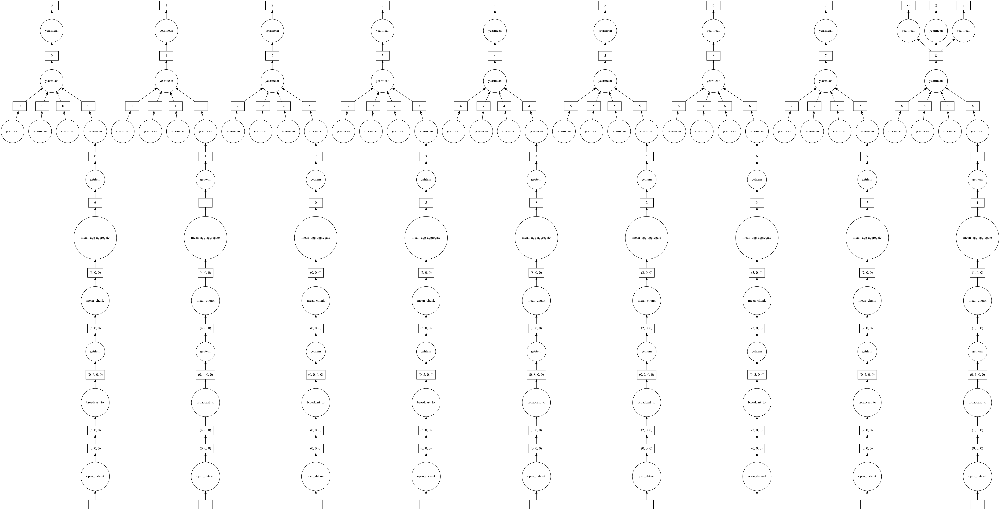

In [110]:
# map_blocks applies function yearmean to each block once, whereas without map_blocks yearmean is calculated for each year
gmst_ym_map_blocks.data.visualize()

In [107]:
gmst_ym.data

,Array,Chunk
Bytes,660 B,4 B
Shape,"(165,)","(1,)"
Count,1035 Tasks,165 Chunks
Type,float32,numpy.ndarray


In [114]:
gmst_ym_map_blocks.data

dask.array<yearmean-f5d17adafbd50601bab0de0401cdc2af-<this, shape=(165,), dtype=float32, chunksize=(20,), chunktype=numpy.ndarray>

CPU times: user 1.62 s, sys: 392 ms, total: 2.01 s
Wall time: 1.07 s
CPU times: user 2.41 s, sys: 562 ms, total: 2.97 s
Wall time: 1.42 s


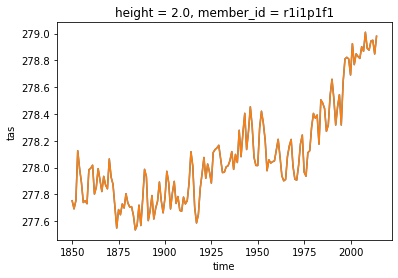

In [113]:
# yields same results
# faster cos larger chunks less tasks
%time gmst_ym_map_blocks.plot(label='map_blocks')
# slower cos every task comes with tiny overhead for dask
%time gmst_ym.plot(label='normal')

## multi-model analysis

In [299]:
# col.search selects the experiments you specify in `query`
variable = "tas"
query = dict(
    experiment_id="historical",
    table_id="Amon",
    member_id="r1i1p1f1",
    variable_id=variable,
    # source_id="MPI-ESM1-2-LR",
)
cat = col.search(**query)
source_ids = list(cat.df.source_id.unique())
# some data cleaning: wrong times found
for models in ["E3SM-1-1-ECA", "NorCPM1", "FGOALS-g3"]:
    source_ids.remove(models)
cat = col.search(**query, source_id=source_ids)
cat

,unique
activity_id,1
institution_id,25
source_id,37
experiment_id,1
member_id,1
table_id,1
variable_id,1
grid_label,3
dcpp_init_year,0
version,34


In [300]:
# cdf_kwargs are given to xarray.open_dataset
# cftime is like datetime but extends to all four digit years and many calendar types
dset_dict = cat.to_dataset_dict(cdf_kwargs={"chunks": {"time": -1}, "use_cftime": True})
list(dset_dict)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


/work/mh0727/m300524/miniconda3/envs/pymistral/lib/python3.7/site-packages/xarray/conventions.py:498: SerializationWarning: variable 'tas' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


['CMIP.MRI.MRI-ESM2-0.historical.Amon.gn',
 'CMIP.IPSL.IPSL-CM6A-LR.historical.Amon.gr',
 'CMIP.CAMS.CAMS-CSM1-0.historical.Amon.gn',
 'CMIP.CAS.CAS-ESM2-0.historical.Amon.gn',
 'CMIP.CSIRO-ARCCSS.ACCESS-CM2.historical.Amon.gn',
 'CMIP.BCC.BCC-ESM1.historical.Amon.gn',
 'CMIP.BCC.BCC-CSM2-MR.historical.Amon.gn',
 'CMIP.NUIST.NESM3.historical.Amon.gn',
 'CMIP.CSIRO.ACCESS-ESM1-5.historical.Amon.gn',
 'CMIP.FIO-QLNM.FIO-ESM-2-0.historical.Amon.gn',
 'CMIP.NIMS-KMA.KACE-1-0-G.historical.Amon.gr',
 'CMIP.THU.CIESM.historical.Amon.gr',
 'CMIP.CAS.FGOALS-f3-L.historical.Amon.gr',
 'CMIP.CCCma.CanESM5.historical.Amon.gn',
 'CMIP.NCAR.CESM2.historical.Amon.gn',
 'CMIP.NCAR.CESM2-WACCM.historical.Amon.gn',
 'CMIP.UA.MCM-UA-1-0.historical.Amon.gn',
 'CMIP.MIROC.MIROC6.historical.Amon.gn',
 'CMIP.INM.INM-CM5-0.historical.Amon.gr1',
 'CMIP.NOAA-GFDL.GFDL-CM4.historical.Amon.gr1',
 'CMIP.NOAA-GFDL.GFDL-ESM4.historical.Amon.gr1',
 'CMIP.INM.INM-CM4-8.historical.Amon.gr1',
 'CMIP.NASA-GISS.GISS-E2-1-

In [302]:
# ultimate goal to get all data into one object: will ease following computation
da = []
modellist = []
orig_size = 0

expected_time = xr.cftime_range(start="1850", freq="MS", periods=165 * 12)
for key, value in dset_dict.items():
    da_model = value["tas"]
    model = key.split(".")[2]
    # print(f"Processing {model} ...")
    if "member_id" in da_model.dims:
        da_model = da_model.isel(member_id=0, drop=True)

    orig_size += da_model.nbytes
    spatial_dims = [d for d in da_model.dims if d not in ["time"]]
    da_model_spatial_mean = da_model.mean(spatial_dims).sortby("time")
    # often time is differently formatted, therefore overwrite
    da_model_spatial_mean["time"] = expected_time
    # optional rechunk time
    da_model_spatial_mean = da_model_spatial_mean.chunk({"time": "auto"})
    da.append(da_model_spatial_mean)
    modellist.append(model)

In [303]:
da = xr.concat(da, dim="model", coords="minimal")
da["model"] = modellist

In [304]:
da.data

dask.array<concatenate, shape=(37, 1980), dtype=float32, chunksize=(1, 1980), chunktype=numpy.ndarray>

In [305]:
from dask.utils import format_bytes

print(f"Collapsed {format_bytes(orig_size)} into {format_bytes(da.nbytes)}")

Collapsed 11.30 GB into 293.04 kB


In [264]:
# trigger execution, remaining coding is data light and better suited for eager data
%time da = da.compute()

CPU times: user 1min 57s, sys: 21.7 s, total: 2min 18s
Wall time: 1min 20s


In [306]:
# with optional rechunk
%time da = da.compute()

CPU times: user 2min, sys: 21.2 s, total: 2min 21s
Wall time: 1min 22s


In [307]:
# usually I save important intermediate data to to disk (preferably in zarr format)
# the dashboard shows that I/O is the bottleneck, xarray takes time to check coordinates when concatinating

In [ ]:
# look into the data
# strong seasonal cycle, models have different base levels
da.plot(hue="model")
plt.show()

In [309]:
# best practice: all data into one xr.object, the do the math afterwards with automatic broadcasting
# add observations to da
obs = (
    xr.open_dataset(
        "/pool/data/ICDC/atmosphere/hadcrut/DATA/hadcrut4/HadCRUT.4.6.0.0.median.nc"
    )
    .rename({"temperature_anomaly": "tas"})["tas"]
    .squeeze()
)
obs = obs.expand_dims("model")
obs["model"] = ["HadCRUT4 obs"]
obs["time"] = xr.cftime_range(start="1850", freq="MS", periods=obs.time.size)
obs = obs.sel(time=slice("1850", "2019"))

obss = obs.mean(["longitude", "latitude"])
da = xr.concat([obss, da], "model")

/work/mh0727/m300524/miniconda3/envs/pymistral/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


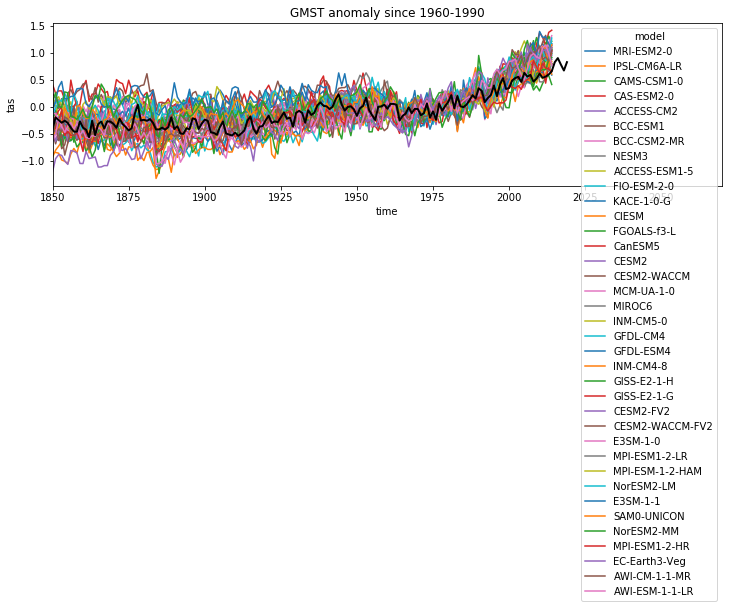

In [311]:
# anomaly plot
anom = yearmean(da - da.sel(time=slice("1960", "1990")).mean("time"))
anom.drop_sel(model="HadCRUT4 obs").plot(hue="model", figsize=(12, 3))
anom.sel(model="HadCRUT4 obs").plot(c="k", lw=2)
plt.title("GMST anomaly since 1960-1990")
plt.xlim([1850, 2070])
plt.show()

## warming over the last 30 years
Scientific question: Where do the climate models simulate the warming?

All climate models may have different resolution, therefore the coordinates are not identical, so we cannot create one large dataarray (unless we regrid with `xesmf`). Therefore we calculate the trend and plot each model separately.

Processing MRI-ESM2-0 ...
Processing IPSL-CM6A-LR ...
Processing CAMS-CSM1-0 ...
Processing CAS-ESM2-0 ...
Processing ACCESS-CM2 ...
Processing BCC-ESM1 ...
Processing BCC-CSM2-MR ...
Processing NESM3 ...
Processing ACCESS-ESM1-5 ...
Processing FIO-ESM-2-0 ...
Processing KACE-1-0-G ...
Processing CIESM ...
Processing FGOALS-f3-L ...
Processing CanESM5 ...
Processing CESM2 ...
Processing CESM2-WACCM ...
Processing MCM-UA-1-0 ...
reset lon lat
Processing MIROC6 ...
Processing INM-CM5-0 ...
Processing GFDL-CM4 ...
Processing GFDL-ESM4 ...
Processing INM-CM4-8 ...
Processing GISS-E2-1-H ...
Processing GISS-E2-1-G ...
Processing CESM2-FV2 ...
Processing CESM2-WACCM-FV2 ...
Processing E3SM-1-0 ...
Processing MPI-ESM1-2-LR ...
Processing MPI-ESM-1-2-HAM ...
Processing NorESM2-LM ...
Processing E3SM-1-1 ...
Processing SAM0-UNICON ...
Processing NorESM2-MM ...
Processing MPI-ESM1-2-HR ...
Processing EC-Earth3-Veg ...
Processing AWI-CM-1-1-MR ...
Processing AWI-ESM-1-1-LR ...
CPU times: user 10m

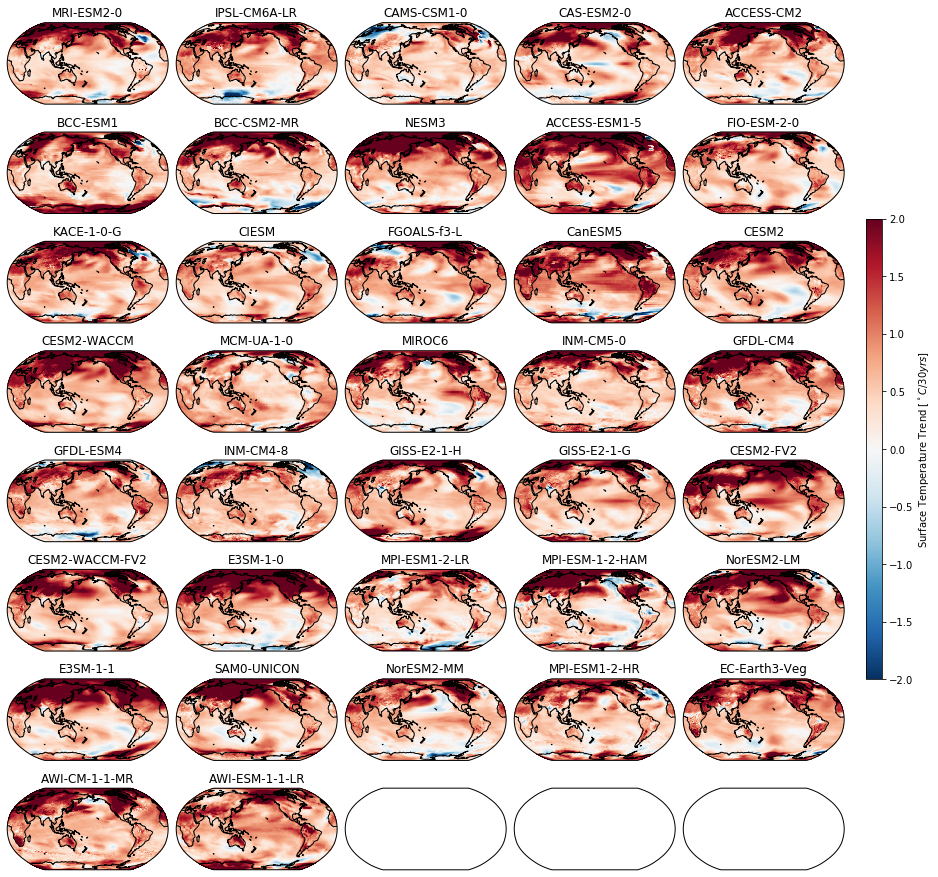

In [312]:
%%time

import cartopy.crs as ccrs
import cartopy.feature as cfeature

ncols = 5
nrows = int(np.ceil(len(dset_dict) / ncols))
fig, axarr = plt.subplots(
    ncols=ncols,
    nrows=nrows,
    figsize=[ncols*3, nrows*2],
    subplot_kw={"projection": ccrs.Robinson(180)},
)
for ax, (key, ds) in zip(axarr.flat, dset_dict.items()):
    da_model = ds["tas"]
    model = key.split(".")[2]
    print(f'Processing {model} ...')
    if "member_id" in da_model.dims:
        da_model = da_model.isel(member_id=0, drop=True)
    orig_size += da_model.nbytes
    spatial_dims = [d for d in da_model.dims if d not in ["time"]]
    # data cleaning
    if set(spatial_dims) != set(["lon", "lat"]):
        print('reset lon lat')
        da_model = da_model.rename({"longitude": "lon", "latitude": "lat"})
    # often time is differently formatted, therefore overwrite
    da_model = da_model.sortby("time")
    da_model["time"] = expected_time
    da_model = yearmean(da_model.sel(time=slice("1985", "2014"))).chunk(
        {"time": -1,'lon':'auto','lat':'auto'}
    )
    trend = (
        da_model.polyfit("time", 1)
        .sel(degree=1)
        .rename({"polyfit_coefficients": "trend"})["trend"]
        * da_model.time.size
    )

    pp = trend.plot(
        ax=ax,
        x="lon",
        y="lat",
        vmin=-2,
        vmax=2,
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        cmap="RdBu_r",
    )
    ax.set_title(ds.attrs["source_id"])
    ax.coastlines()

fig.subplots_adjust(hspace=0.05, wspace=0.05)
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.3, 0.015, 0.4])
fig.colorbar(pp, cax=cbar_ax, label="Surface Temperature Trend [$^\circ C / 30 yrs$]")

Polar amplification: Changes in net radiation warm poles much more than tropics. https://en.wikipedia.org/wiki/Polar_amplification

## Heavy lifting
MPI-ESM High-Resolution model prediction runs started 5 members every 1st november from 1960 to 2018

In [511]:
v = "intpp"
hind = xr.open_zarr("/work/mh0727/m300524/DCPP_post/hind_MPI-ESM1-2-HR_ym.zarr")[v]
assim = xr.open_zarr("/work/mh0727/m300524/DCPP_post/assim_MPI-ESM1-2-HR_ym.zarr")[v]
hind.coords

Coordinates:
    depth      float64 ...
  * i          (i) int32 0 1 2 3 4 5 6 7 8 ... 794 795 796 797 798 799 800 801
  * init       (init) float64 1.96e+03 1.961e+03 ... 2.017e+03 2.018e+03
  * j          (j) int32 0 1 2 3 4 5 6 7 8 ... 396 397 398 399 400 401 402 403
    latitude   (j, i) float64 dask.array<chunksize=(404, 802), meta=np.ndarray>
  * lead       (lead) int64 1 2 3 4 5 6 7 8 9 10
    lev        float64 ...
    longitude  (j, i) float64 dask.array<chunksize=(404, 802), meta=np.ndarray>
  * member     (member) int64 1 2 3 4 5

In [512]:
# 5 dimensional dataset
hind.data

dask.array<zarr, shape=(5, 59, 10, 404, 802), dtype=float32, chunksize=(1, 59, 1, 404, 802), chunktype=numpy.ndarray>

In [513]:
# climpred does verification-forecast time matching and has verification metrics like sklearn.metrics but multi-dimensional
from climpred import HindcastEnsemble

he = HindcastEnsemble(hind)
he = he.add_observations(assim, "assimilation")

/work/mh0727/m300524/miniconda3/envs/pymistral/lib/python3.7/site-packages/climpred/utils.py:141: UserWarning: Assuming annual resolution due to numeric inits. Change init to a datetime if it is another resolution.
  'Assuming annual resolution due to numeric inits. '


In [514]:
%time skill = he.verify(metric="pearson_r")

CPU times: user 10 s, sys: 6.65 s, total: 16.7 s
Wall time: 9.6 s


In [515]:
skill.intpp.data

dask.array<concatenate, shape=(10, 404, 802), dtype=float64, chunksize=(1, 404, 802), chunktype=numpy.ndarray>

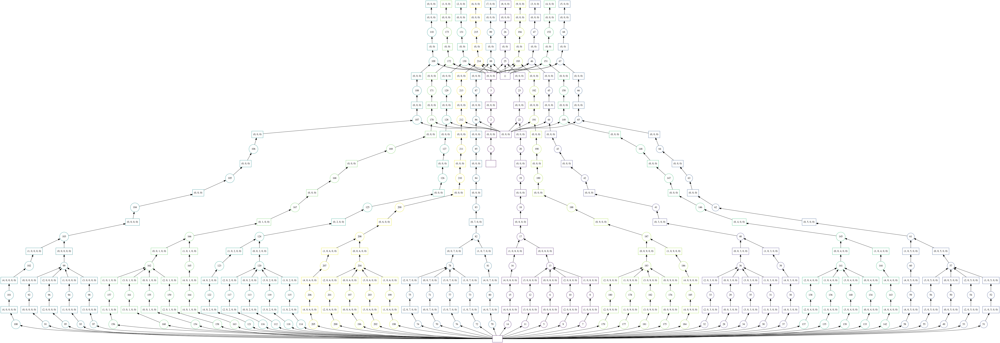

In [516]:
skill.intpp.data.visualize(color="order", cmap="viridis")

In [481]:
%time skill = skill.compute()

/work/mh0727/m300524/miniconda3/envs/pymistral/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


CPU times: user 21.9 s, sys: 51.9 s, total: 1min 13s
Wall time: 10.8 s


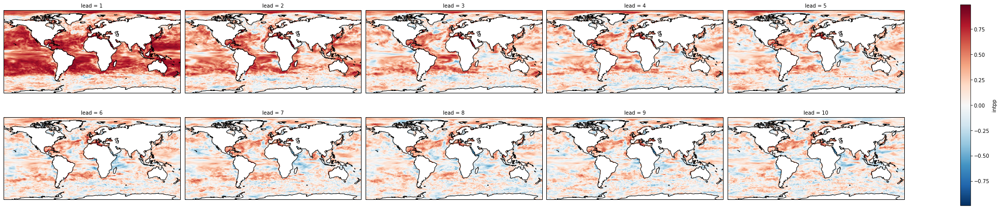

In [455]:
# primary production potentially predictable for 1-2 years in moderate latitudes
p = skill[v].plot(
    col="lead",
    col_wrap=5,
    aspect=2,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree()},
    x="longitude",
    y="latitude",
)
p.map(lambda: plt.gca().coastlines())

In [456]:
# more clever chunking yields identical results faster
%time skill2 = he.chunk({'i':'auto','j':'auto','member':-1,'lead':1, 'init':-1}).verify(metric="pearson_r")

CPU times: user 2.38 s, sys: 330 ms, total: 2.71 s
Wall time: 2.55 s


In [457]:
skill2.intpp.data

dask.array<concatenate, shape=(10, 404, 802), dtype=float64, chunksize=(1, 202, 401), chunktype=numpy.ndarray>

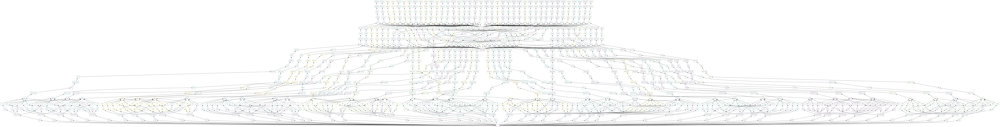

In [407]:
skill2.intpp.data.visualize(color="order", cmap="viridis")

In [458]:
%time skill2 = skill2.compute()

/work/mh0727/m300524/miniconda3/envs/pymistral/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


CPU times: user 13.5 s, sys: 16.9 s, total: 30.4 s
Wall time: 5.06 s


In [459]:
xr.testing.assert_identical(skill, skill2)